<a href="https://colab.research.google.com/github/jinuHH/YOLOv5_Practice/blob/main/YOLOv5_Practice.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# YOLOv5 모델 학습 연습하기

# 1. 구글 드라이브 마운트
* 구글 드라이브를 마운트해야 구글 드라이브에 yolo 코드를 다운받고, 드라이브에 있는 데이터로 학습을 할 수 있음



In [1]:
from google.colab import drive
import os

drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
# 작업 경로를 MyDrive로 변경하여 구글 드라이브에 접속 후 바로 작업 디렉토리를 확인 가능

# 현재 작업 디렉토리 확인
print('현재 작업 경로 :', os.getcwd())

# 작업 디렉토리 변경
os.chdir('/content/drive/MyDrive')
print('변경된 작업 경로 :', os.getcwd())


현재 작업 경로 : /content
변경된 작업 경로 : /content/drive/MyDrive


# 2. YOLOv5 레포지토리 다운로드
* 코드를 실행하면 구글 드라이브에 YOLOv5 코드가 다운로드 됨
* 두 번째 학습부터는 건너뛰어도 되는 부분이고, 패키지 다운로드 및 임포트 하는 부분은 매번 실행해줘야 함

In [3]:
# YOLOv5 레퍼지토리 clone
# 처음에 한번만 실행
!git clone https://github.com/ultralytics/yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 16383, done.
remote: Counting objects: 100% (277/277), done.
remote: Compressing objects: 100% (203/203), done.
remote: Total 16383 (delta 138), reused 159 (delta 74), pack-reused 16106
Receiving objects: 100% (16383/16383), 15.16 MiB | 13.37 MiB/s, done.
Resolving deltas: 100% (11175/11175), done.
Updating files: 100% (146/146), done.


In [5]:
# 필요한 패키지 다운로드 및 임포트
# 학습 할 때마다 실행
%cd yolov5
%pip install -qr requirements.txt
%pip install -q roboflow
%pip install fastapi kaleido python-multipart uvicorn
%pip install lida

import torch
import yaml
from IPython.display import Image, clear_output  # to display images


[Errno 2] No such file or directory: 'yolov5'
/content/drive/MyDrive/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.5/60.5 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.1/71.1 kB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 7.2 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_extensions-4.5.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-probability 0.22.0 requires typing-extensions<4.6.0, but you h

# 3. 데이터셋 다운로드, yaml 파일 수정
* 사용하고자 하는 커스텀 데이터셋을 구글 드라이브에 "dataset"폴더에 업로드
* "dataset"폴더 안에는 학습/평가 데이터와 annotation(라벨) 그리고 데이터셋이 대한 설명이 담긴 yaml파일 필요
* Roboflow의 public dataset 사용
  * roboflow 사이드에서 사용하고 싶은 데이터셋 다운로드 해서 압축해제 후 구글 드라이브 "dataset"폴더에 업로드
  * 여러 포맷으로 다운로드 할 수 있는데 그 중에서 TXT - YOLOv5 Pytorch로 다운로드
* 그 외 커스텀 데이터셋 사용할 경우
  * 다른 데이터셋이나 본인이 만든 데이터셋을 사용하고 싶다면 데이터, 라벨, yaml 파일을 모두 퍼블릭 데이터셋의 규격에 맞게 통일해줘야 됨(데이터셋 로딩하는 코드를 수정해도 됨)
* yaml 파일 수정
  * train, val(또는 test) 데이터가 있는 경로 수정 필요
  



In [8]:
# 사용할 데이터셋 경로 및 데이터셋의 yaml 파일 경로 지정
data_dir = "/content/drive/MyDrive/dataset/x-ray_rheumatology"
data_yaml = "/content/drive/MyDrive/dataset/x-ray_rheumatology/data.yaml"


In [9]:
# 데이터셋 yaml 파일 확인
with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)


{'train': '../train/images',
 'val': '../valid/images',
 'nc': 12,
 'names': ['artefact',
  'distal phalanges',
  'fifth metacarpal bone',
  'first metacarpal bone',
  'fourth metacarpal bone',
  'intermediate phalanges',
  'proximal phalanges',
  'radius',
  'second metacarpal bone',
  'soft tissue calcination',
  'third metacarpal bone',
  'ulna']}

In [11]:
# yaml 파일의 train, val 데이터가 있는 경로 수정 (기존 경로 -> 구글 드라이브에 저장된 경로)
film['train'] = '/content/drive/MyDrive/dataset/x-ray_rheumatology/train/images'
film['val'] = '/content/drive/MyDrive/dataset/x-ray_rheumatology/test/images'

with open(data_yaml, 'w') as f:
  yaml.dump(film, f)

print("변경된 yaml 파일 :")
with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)


변경된 yaml 파일 :


{'names': ['artefact',
  'distal phalanges',
  'fifth metacarpal bone',
  'first metacarpal bone',
  'fourth metacarpal bone',
  'intermediate phalanges',
  'proximal phalanges',
  'radius',
  'second metacarpal bone',
  'soft tissue calcination',
  'third metacarpal bone',
  'ulna'],
 'nc': 12,
 'train': '/content/drive/MyDrive/dataset/x-ray_rheumatology/train/images',
 'val': '/content/drive/MyDrive/dataset/x-ray_rheumatology/test/images'}

# 4.YOLOv5 모델 학습
* batch size, epoch, model size 등을 선택하여 학습시킬 수 있음
* 학습 결과 중 베스트 모델이 저장됨 -> 모델이 저장된 경로 확인 필수
  * img : 입력 이미지 크기
  * batch : 배치 사이즈
  * epochs : 총 학습 에폭
  * data : 데이터셋 yaml 파일 경로
  * weights : 모델 웨이트 경로(pre-train 된 모델로 학습시키기 때문에)
  * cache : 캐시 이미지



In [14]:
!python train.py --img 135 --batch 16 --epochs 150 --data {data_yaml} --weights yolov5s.pt --cache

2024-01-19 11:15:15.830195: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-19 11:15:15.830279: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-19 11:15:15.832617: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=yolov5s.pt, cfg=, data=/content/drive/MyDrive/dataset/x-ray_rheumatology/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=150, batch_size=16, imgsz=135, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, evolve_population=data/hyps, resume_evolve=None, bucket=, cache=ram, image_weights=False, d

# 5. 텐서보드 시작하기
* 텐서보드는 학습시키는 딥러닝 모델이 잘 학습되는지 시작적으로 확인할 수 있는 어플리케이션

In [15]:
# 텐서보드 시작하기
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

# 6. 학습한 모델 테스트

In [38]:
# 테스트 이미지 경로
test_data_dir = film['val']

# 실험 번호 지정 - 진행한 실험이 저장된 경로 확인해서 기입 - runs/train/exp1 인지, exp2, exp3 인지 확인후 아래 번호 지정
train_exp_num = 3


In [39]:
!python detect.py --weights runs/train/exp{train_exp_num}/weights/best.pt --img 416 --conf 0.1 --source {test_data_dir}

detect: weights=['runs/train/exp3/weights/best.pt'], source=/content/drive/MyDrive/dataset/x-ray_rheumatology/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-278-g050c72c Python-3.10.12 torch-2.1.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7042489 parameters, 0 gradients, 15.9 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/16 /content/drive/MyDrive/dataset/x-ray_rheumatology/test/images/image1_png_jpg.rf.0754a001a109de23938168702dcf2ed6.jpg: 384x416 17 distal phalangess, 7 fifth metacarpal bones, 3 first metacarpal bones, 17 intermediate phalangess, 32 prox

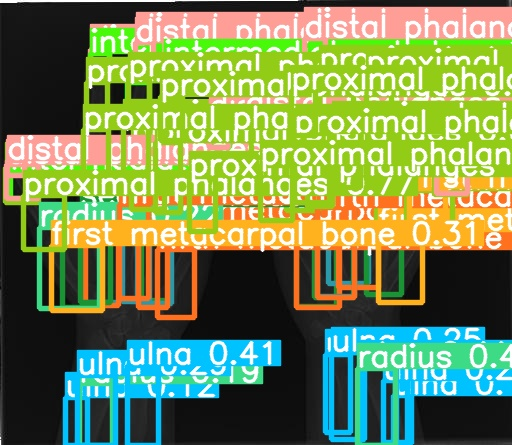

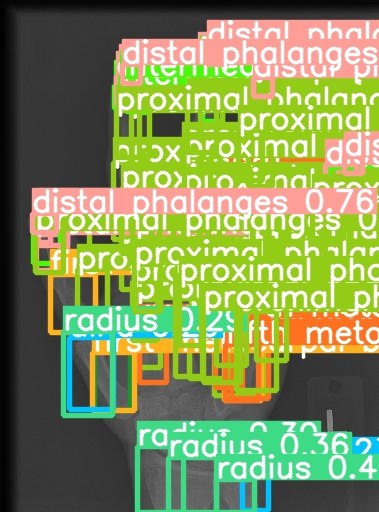

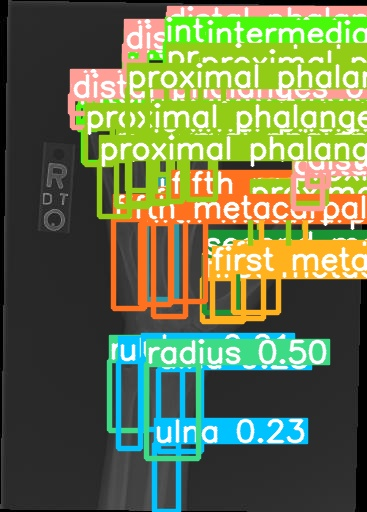

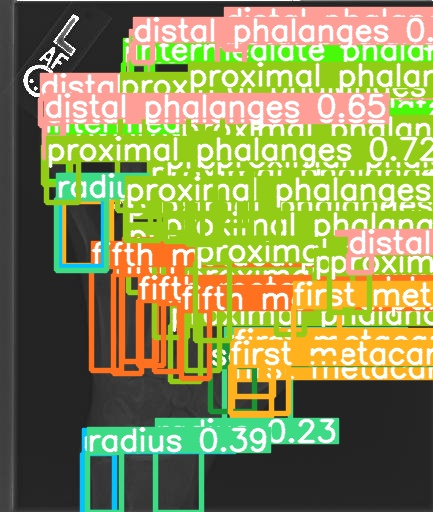

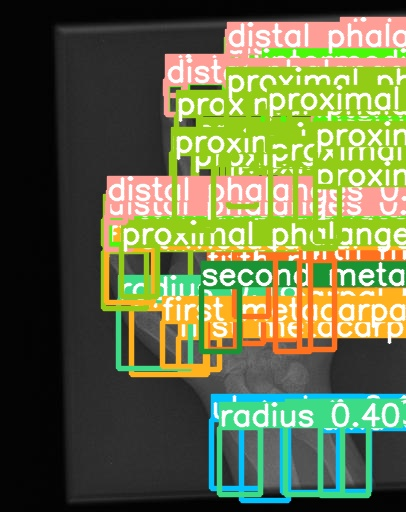

...

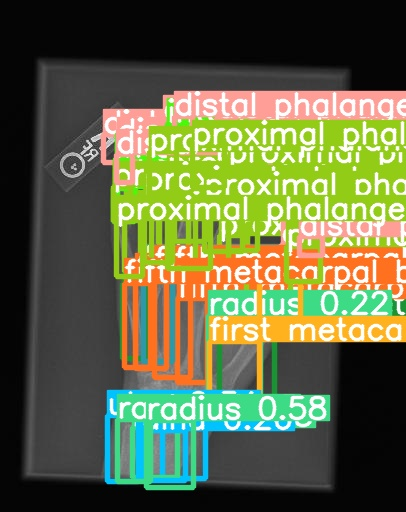

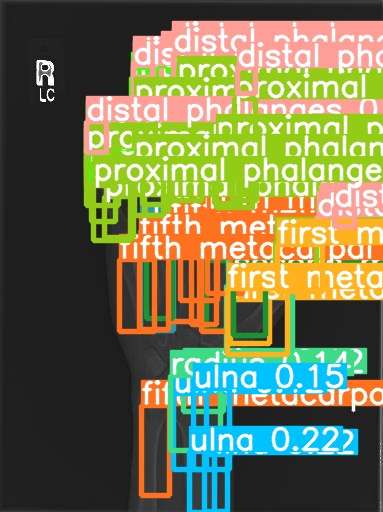

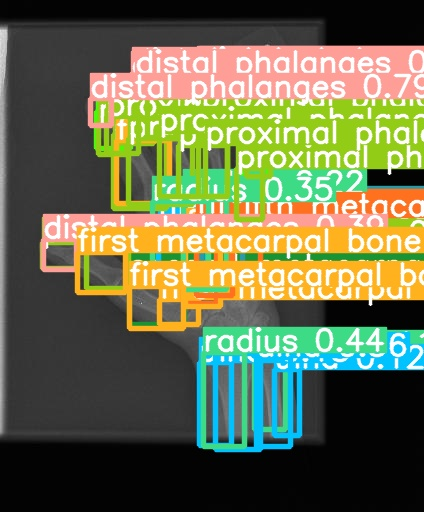

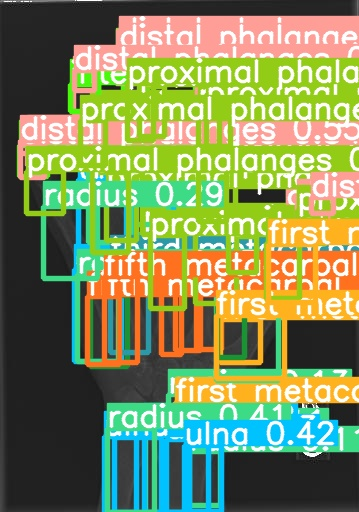

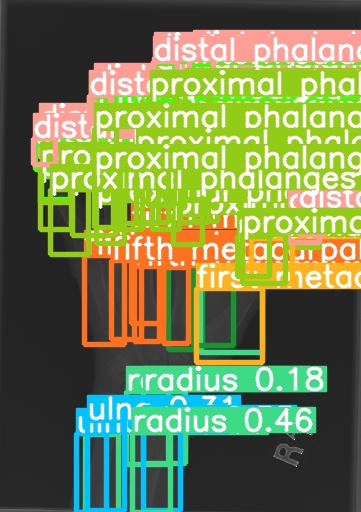

In [40]:
# 테스트 결과 확인해보기
import glob
from IPython.display import Image, display

test_exp_num = 2

if not os.path.exists('/content/drive/MyDrive/yolov5/runs/detect/exp' + str(test_exp_num) + '/'):
  raise Exception('text_exp_num 을 다시 확인하세요')

for imageName in glob.glob('/content/drive/MyDrive/yolov5/runs/detect/exp' + str(test_exp_num) + "/*.jpg"):
  display(Image(filename=imageName))
  print('\n')


# 7. 학습한 베스트 모델 저장

In [ ]:
# 학습한 베스트 모델 저장
from google.colab import files
files.download('./runs/train/exp' + str(test_exp_num) + '/weights/best.pt')